In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim

In [267]:
# loss function

def grad_optr(image):

    dx = image.squeeze() - F.pad(image.squeeze(), (0, 1, 0, 0))[:, 1:]
    dy = image.squeeze() - F.pad(image.squeeze(), (0, 0, 0, 1))[1:, :]

    dx[:, -1] = 0
    dy[-1, :] = 0

    return dx, dy

def wrap(vector):
    return torch.remainder(vector + torch.pi, 2*torch.pi)

def loss_fn(predict, target):
    
    del_pred_x, del_pred_y = grad_optr(predict)
    del_tar_x, del_tar_y = grad_optr(target)

    dx_dy_pred = torch.concat([wrap(del_pred_x).ravel().unsqueeze(dim=1), wrap(del_pred_y).ravel().unsqueeze(dim=1)], dim=1)
    dx_dy_tar_wrap = torch.concat([wrap(del_tar_x).ravel().unsqueeze(dim=1), wrap(del_tar_y).ravel().unsqueeze(dim=1)], dim=1)

    norm = torch.linalg.norm(dx_dy_pred- dx_dy_tar_wrap, dim=1)
    loss = torch.sum(norm)


    return loss

def total_variation_loss(img, weight):
     h_img, w_img = img.size()
     tv_h = torch.pow(img[1:,:]-img[:-1,:], 2).sum()
     tv_w = torch.pow(img[:,1:]-img[:,:-1], 2).sum()
     return weight*(tv_h+tv_w)/(h_img*w_img)

In [173]:
def propagation(numPx, sizePx=[6*1e-6, 6*1e-6], wl=550*1e-9):

    sizeSensorX = numPx[0]*sizePx[0] # sensor size along x-axis
    sizeSensorY = numPx[1]*sizePx[1] # sensor size along y-axis

    # Sampling plane 2x for linearization
    Sx = sizeSensorX
    Sy = sizeSensorY

    # max freq to prevent aliasing by the transfer function
    delU = 1/Sx
    delV = 1/Sy

    freqRows = torch.linspace(-1/(2*sizePx[0]), 1/(2*sizePx[0]), round(1/(sizePx[0]*delU))) ## -maxFreq/2, +maxFreq/2
    freqCols = torch.linspace(-1/(2*sizePx[1]), 1/(2*sizePx[1]), round(1/(sizePx[1]*delV)))

    u, v = torch.meshgrid(freqRows, freqCols)
    k = wl**(-2) - u**2 - v**2

    return torch.sqrt(k)

In [294]:
# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -12.3165],
        [-108.3250],
        [ -12.7425],
        [   4.7154],
        [   5.1158],
        [ -14.5261],
        [   2.3329],
        [  -2.5917],
        [   0.9364],
        [  -1.8796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
target = torch.tensor(phase_img).T

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

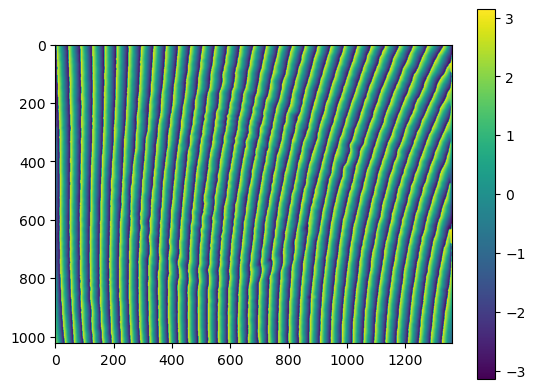

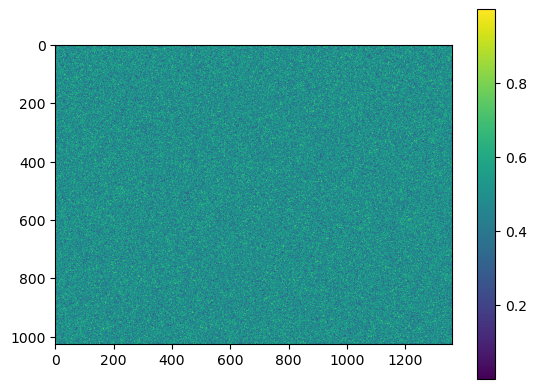

In [295]:
plt.imshow(target.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

0 0.23817512555090753
1 0.15802447316886986
2 0.1023398610436483
3 0.06912589682253664
4 0.0541196845164683
5 0.05046106567993165
6 0.05133344562852686
7 0.052587787781591074
8 0.05250195226276116
9 0.050785706441103314
10 0.047732739735286925
11 0.043933614985135
12 0.04000597777096121
13 0.03640977027846964
14 0.03336804427577948
15 0.030926489697079614
16 0.029017885661217917
17 0.02751389231566225
18 0.02629857447948666
19 0.025263324946500063
20 0.024340473749686536
21 0.023484108964019142
22 0.022660179662678023
23 0.021871162243525234
24 0.021110964330449438
25 0.020378256400742874
26 0.01969687846837506
27 0.019064705385109952
28 0.018491226620002795
29 0.017969386199814197
30 0.01749073786266698
31 0.017046620175439606
32 0.016642263971164924
33 0.016271921019508917
34 0.015935947304689245
35 0.015628291005938582
36 0.015344981085739829
37 0.015089358048977616
38 0.014854164631522752
39 0.014634047220707023
40 0.01442855419513365
41 0.014235775316657024
42 0.014060627139217156

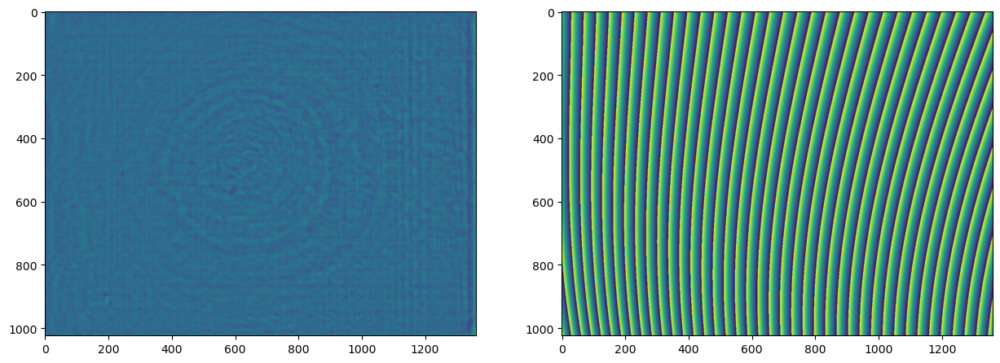

50 0.013030663143451452
51 0.012939397173288724
52 0.012855461909306058
53 0.01277872167541233
54 0.01269840137550446
55 0.012631982680199069
56 0.012575250194039751
57 0.012513709362016122
58 0.012455695005265166
59 0.012396344030804085
60 0.012347894565114615
61 0.012299090936629554
62 0.012263818005376466
63 0.012235985315156508
64 0.012194099107416615
65 0.012152678237802509
66 0.012132107094274655
67 0.01210151541675428
68 0.012072390174518768
69 0.012047209546584942
70 0.012024718945230545
71 0.011992708565289004
72 0.011978837850675874
73 0.011953507586382193
74 0.011940045943527126
75 0.011918105447214482
76 0.011898343427008306
77 0.01188301840741592
78 0.01185815213019098
79 0.011840921090083474
80 0.011827999848848551
81 0.01181787568091638
82 0.011805795230574895
83 0.011806891489580931
84 0.011792100296219936
85 0.01178253942285189
86 0.011773381932918344
87 0.011764305252150605
88 0.01175920830431994
89 0.011752014029571637
90 0.011754096673078905
91 0.011732575489443146


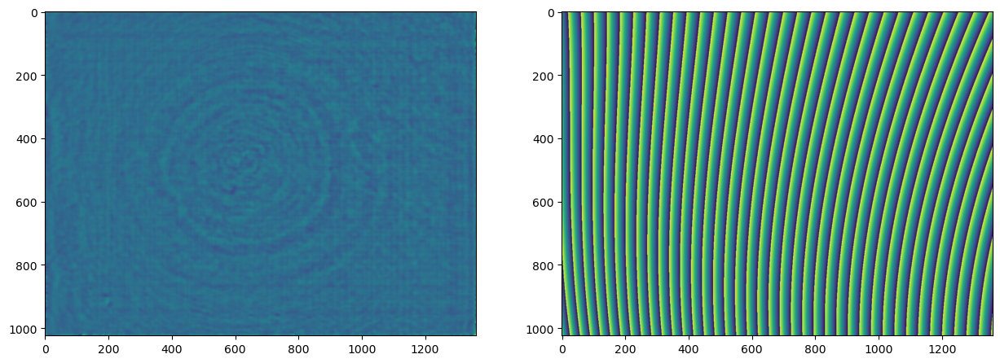

100 0.011730254850689379
101 0.011711367900302713
102 0.011704518011998209
103 0.011685927034078848
104 0.011680970290718733
105 0.011678791118219636
106 0.011674822077397957
107 0.011661725493335275
108 0.011662163016703331
109 0.011649391119554122
110 0.011645646272223009
111 0.011626865262445208
112 0.011611314520688386
113 0.011606861805298302
114 0.011606514091332225
115 0.011590519834650145
116 0.011581598869862736
117 0.011577631669812516
118 0.011576245246934916
119 0.011570250219988993
120 0.01156935029192313
121 0.011570449656276384
122 0.011567399872058246
123 0.011569160094550647
124 0.011564731872558716
125 0.011549910528939503
126 0.011553299287694538
127 0.011537143504103906
128 0.011532366633942914
129 0.011531863576690842
130 0.011524604313284873
131 0.01152527208869587
132 0.011524109909969799
133 0.011514470021488
134 0.011493176900262648
135 0.011501662201650333
136 0.011493844674616241
137 0.011492398855471441
138 0.011485431479049827
139 0.011476700211158408
140 0

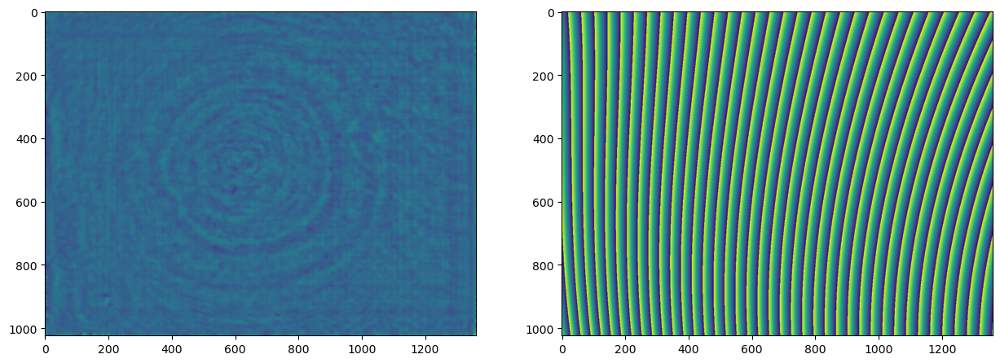

150 0.01142997292985755
151 0.011419069070710589
152 0.011425616208397073
153 0.011411342243280942
154 0.011420900238094672
155 0.011403044305625014
156 0.011410965384232323
157 0.011409254947055239
158 0.011408027639694647
159 0.01140584408652938
160 0.011405607476675246
161 0.011406634618676182
162 0.011411267104058266
163 0.011411037249584453
164 0.0114016797780036
165 0.011401494815152924
166 0.011394880047885896
167 0.01140375873061161
168 0.011406104203330573
169 0.011400837765894564
170 0.011392605104377422
171 0.011391955080298492
172 0.011378562935686825
173 0.011384068719178854
174 0.011375462621748687
175 0.011375190806259079
176 0.011368765632092746
177 0.011358889266200082
178 0.011358061594313145
179 0.011354829228408395
180 0.01134214574758991
181 0.011343696985195969
182 0.011346829951636515
183 0.011345428640760224
184 0.011347458206257575
185 0.011340571242616672
186 0.011355759137880455
187 0.011346540172329056
188 0.011345710861336995
189 0.011350849587987428
190 0.

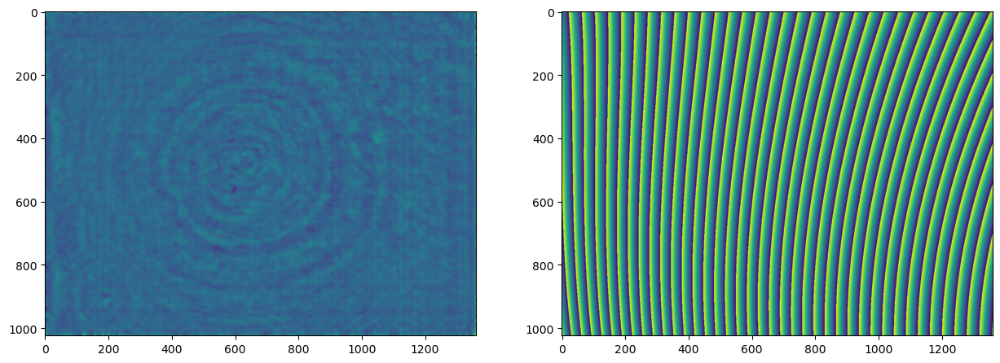

200 0.011342678944853257
201 0.011337257084729619
202 0.011340100895581979
203 0.011314113193850922
204 0.011323708348348031
205 0.011324770294909197
206 0.011322839180114628
207 0.011323026086588216
208 0.011329697236601871
209 0.01132447746235805
210 0.011320378827673764
211 0.011319671770757593
212 0.011310763470087342
213 0.011307544668953496
214 0.011294106376481525
215 0.011306139312200614
216 0.0112949275183309
217 0.01129848469387182
218 0.011288273985288751
219 0.011296684699641162
220 0.011291518958328731
221 0.011303109057730569
222 0.01129321569341456
223 0.01130664083352374
224 0.011297619699399445
225 0.011299306962978267
226 0.011292450005328851
227 0.011297144322841209
228 0.011294840352082613
229 0.011293351574633051
230 0.011298641884928127
231 0.011285067963224298
232 0.011293582953911922
233 0.011304749973164186
234 0.011301632447009494
235 0.011297572197102874
236 0.011300725236083976
237 0.01129122734581092
238 0.011289164573511869
239 0.011284781043051351
240 0.0

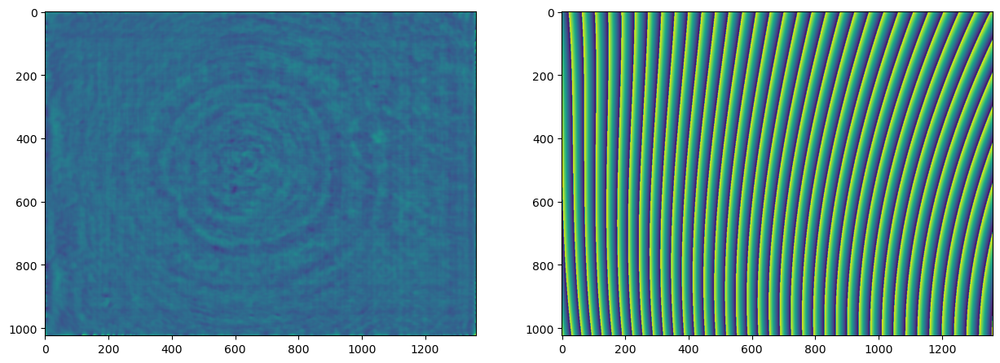

250 0.011243683507518738
251 0.011253515705680527
252 0.011250074387457813
253 0.011252176119162925
254 0.01126547613550172
255 0.011257700676529977
256 0.011262709188098154
257 0.011262692623409053
258 0.01127183707601195
259 0.011258525999842924
260 0.011262737763188226
261 0.011258396853605966
262 0.011257694462421645
263 0.011261320413025314
264 0.011258288130456592
265 0.011253943696182878
266 0.011261010880391402
267 0.011258598508188377
268 0.011269418364218065
269 0.011267423468677207
270 0.011265481846427476
271 0.011267260114469489
272 0.011260569841567558
273 0.011271179231564833
274 0.011266805673176249
275 0.011257436101990984
276 0.011249621617128629
277 0.011259289542257711
278 0.011245194945687275
279 0.011243660450843454
280 0.011233508989026272
281 0.011233333897649998
282 0.011223046054677211
283 0.011230576232649
284 0.011219274517993892
285 0.011221523393440257
286 0.011218711938140044
287 0.01121088254193381
288 0.011216341880256745
289 0.011229853227866132
290 0.

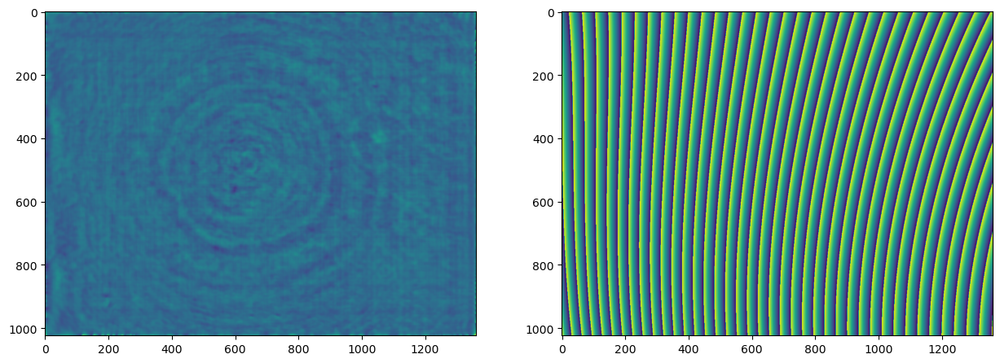

300 0.011207715256034565
301 0.011207751705849537
302 0.011210533802821665
303 0.011225911267047433
304 0.011222375241656124
305 0.011222058210588649
306 0.011226329923550616
307 0.01122197552099129
308 0.011222551969337663
309 0.011227667412591904
310 0.011221155174488627
311 0.011237197512242218
312 0.011221654077563174
313 0.01122811602241361
314 0.011221014957438038
315 0.011230020527245265
316 0.01122078086483907
317 0.011230236910105076
318 0.011219549252895963
319 0.011223413769038253
320 0.011225628691701073
321 0.011227964157115572
322 0.011217386723694179
323 0.011222400620175432
324 0.011220167961742767
325 0.01121509609590467
326 0.011222334164695065
327 0.011215113851006795
328 0.011213507076218052
329 0.011214729975165254
330 0.011219348469543585
331 0.011211984609301794
332 0.01121343524652504
333 0.011212026531445755
334 0.011203671050909332
335 0.011201606093630282
336 0.011214406726141001
337 0.011207673900490378
338 0.011209342673314882
339 0.011190970794237929
340 0

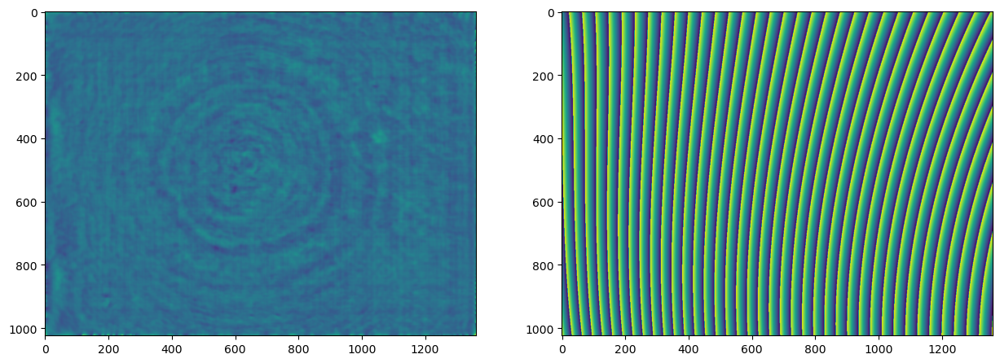

350 0.011187613053860531
351 0.011187134235238405
352 0.011202048402512151
353 0.01119428148436372
354 0.011207831976238945
355 0.01121278116271666
356 0.01120949317132249
357 0.011202556861225173
358 0.011212355704264336
359 0.01120935328882566
360 0.011209391295372084
361 0.011207287607437551
362 0.011204661557891203
363 0.011204413071081878
364 0.011204447978767228
365 0.011201113882466338
366 0.011200649175695286
367 0.011190503196456026
368 0.0111971181916558
369 0.011190550744241978
370 0.011202599099233294
371 0.011185537894983721
372 0.011190925897229118
373 0.011181734155208062
374 0.011182588187326278
375 0.011186838305748749
376 0.011164644296548072
377 0.011182096942570656
378 0.011165325568013853
379 0.01117134380172833
380 0.011172383302297341
381 0.011162905394368629
382 0.011158943381768541
383 0.011164866326935526
384 0.01117085838358085
385 0.011171443334712905
386 0.011176849631503985
387 0.011171693969323824
388 0.01117996509489326
389 0.011174487443895511
390 0.011

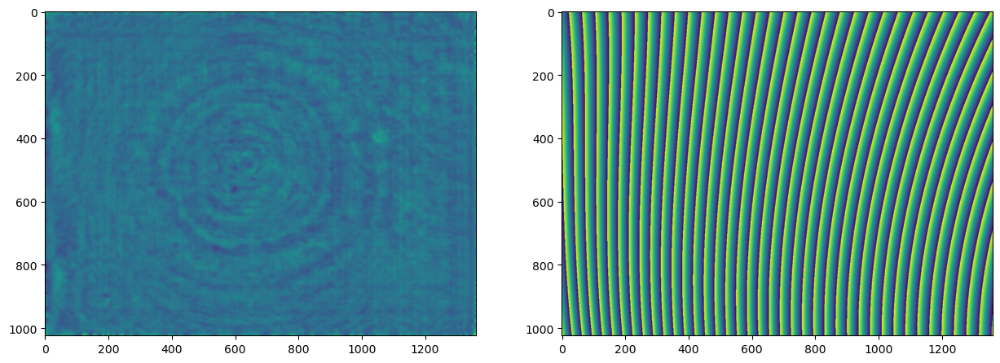

400 0.011188791668533721
401 0.011193294046941405
402 0.011178688670717564
403 0.011179106447028703
404 0.011186855551415645
405 0.011173629708403937
406 0.011178581713519611
407 0.011170078368565142
408 0.011172857731769632
409 0.011177548316167015
410 0.01117743122781091
411 0.011169339158555992
412 0.011167005009770999
413 0.01116317118348066
414 0.011169091759044092
415 0.011160878589131276
416 0.011167280486198802
417 0.011155459304994123
418 0.011172683107229823
419 0.011156156883992309
420 0.011168751884616322
421 0.01116525491268175
422 0.01115815322003708
423 0.011159973447465514
424 0.011169137669567114
425 0.011148140460442853
426 0.011162034187689799
427 0.011145663529613598
428 0.011155466759965104
429 0.011150775503956522
430 0.01117532170848743
431 0.011153500731443694
432 0.011163072953801676
433 0.011152663017992158
434 0.011161055875420862
435 0.011162795220320492
436 0.01116450393767003
437 0.011150997520921281
438 0.01116275966589888
439 0.011159138622432138
440 0.0

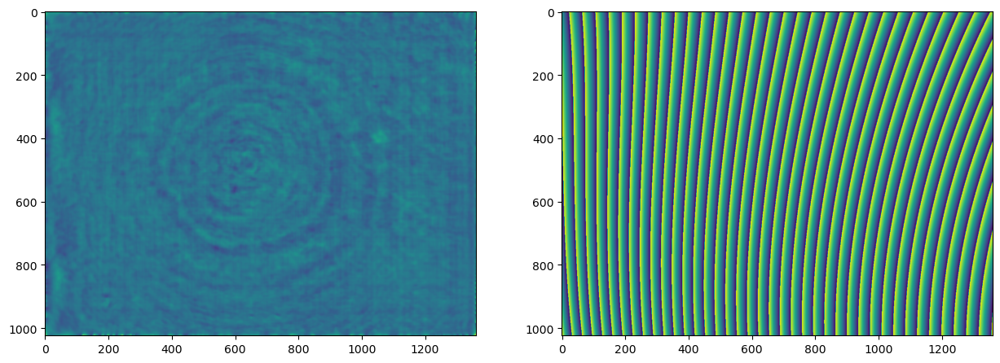

450 0.011152430181665698
451 0.011147899627897192
452 0.011136676721936552
453 0.011137581702854248
454 0.01114191349022941
455 0.011150594470621314
456 0.011155026808344898
457 0.01114786306855651
458 0.011155445393836751
459 0.011147069089268352
460 0.011151734718000475
461 0.011145241205894649
462 0.011143703940754188
463 0.011156251435921067
464 0.011145948496881825
465 0.011148303882704354
466 0.011153863130280816
467 0.011151030969609368
468 0.01114640597305684
469 0.011145366732033422
470 0.011147281313754524
471 0.01113446306334228
472 0.011143023358953851
473 0.011130039770697568
474 0.011129068723008681
475 0.011135368779874342
476 0.011139631458715712
477 0.011141798349714873
478 0.011133433683275738
479 0.011128174514727555
480 0.01113634005776279
481 0.011137820127214799
482 0.01113503708141185
483 0.011150989101884915
484 0.011156877540339288
485 0.011130718096902683
486 0.011152663162575972
487 0.011145231936497307
488 0.01114956206025556
489 0.011147374337972233
490 0.0

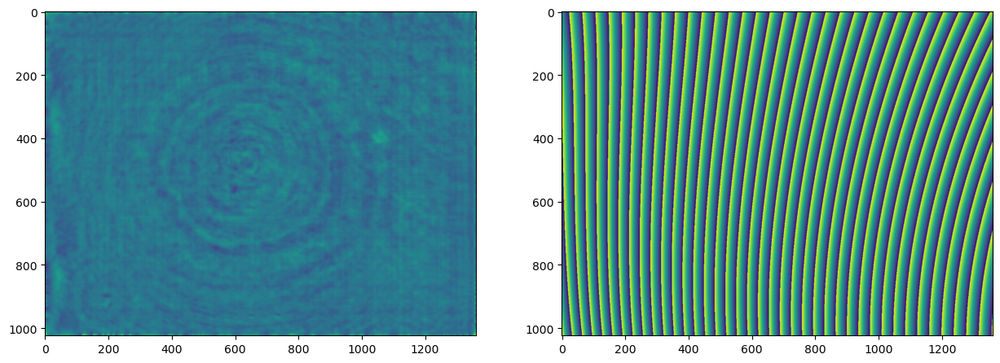

In [296]:
epochs = 500
loss_arr = []


for itr in range(epochs):

    # if itr == 100:
    #     obj_phase = torch.rand(1024, 1360, requires_grad=True)

    optimizer.zero_grad()

    obj = torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm 
    wave_z = torch.angle(wave_obj.propogate(dist))

    # w = propagation(obj_phase.shape)
    # wave_z = torch.angle(torch.fft.ifft2(torch.fft.fft2(wave_op)*torch.exp(1j*2*torch.pi*w.detach()*dist.detach())))
    
    loss = 0.6*loss_fn(wave_z, target)/(1024*1360) + total_variation_loss(obj_phase, 0.4)
    loss.backward()
    optimizer.step()
    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    if (itr+1) % 50 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        axs[1].imshow(torch.angle(wave.detach()))

        plt.show()

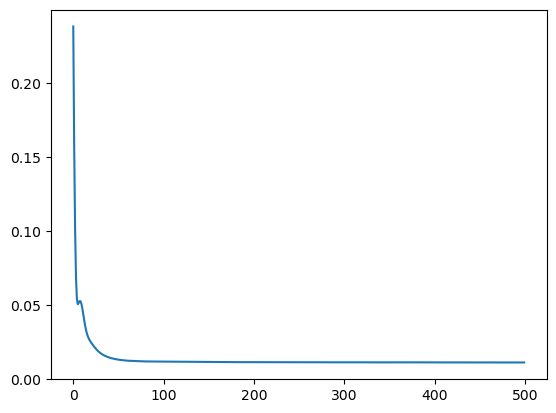

In [297]:
plt.plot(loss_arr)

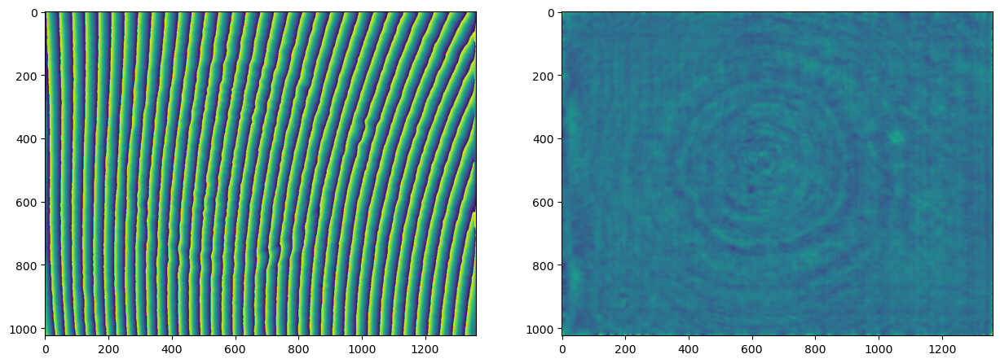

In [298]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(obj_phase.detach())
axs[0].imshow(target.T)


tensor([[ -12.5370],
        [-114.3124],
        [ -13.2109],
        [   4.2243],
        [   6.0445],
        [ -14.4042],
        [   2.4956],
        [   1.3627],
        [   1.4720],
        [   3.3415]], requires_grad=True)

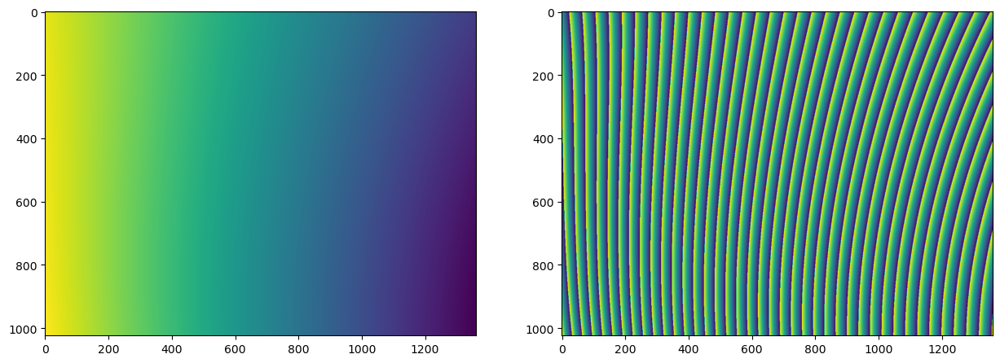

In [299]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

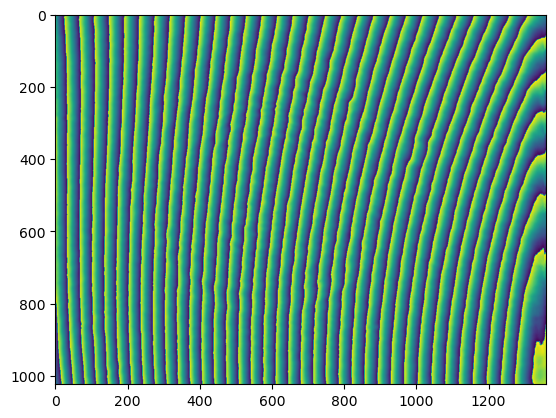

In [300]:
plt.imshow(wave_z.detach().T)

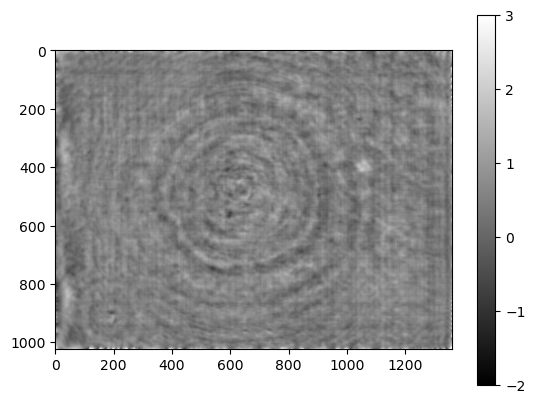

In [301]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()

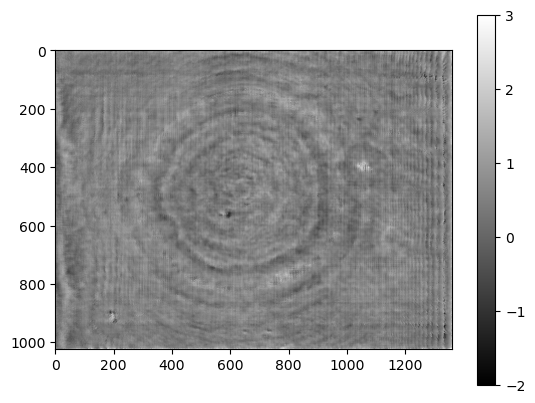

In [191]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()

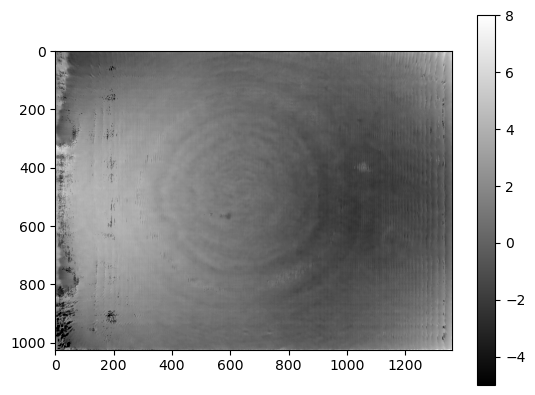

In [142]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmax=8, vmin=-5)
plt.colorbar()

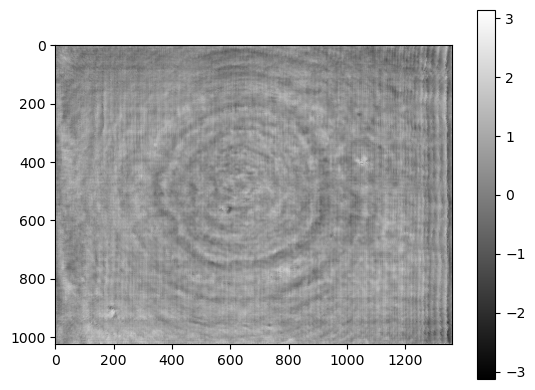

In [131]:
plt.imshow((torch.angle(obj).detach().numpy()), cmap='gray')
plt.colorbar()

In [194]:
from unet import UNet

In [238]:
# loss function

def grad_optr(image):

    dx = image.squeeze() - F.pad(image.squeeze(), (0, 1, 0, 0))[:, 1:]
    dy = image.squeeze() - F.pad(image.squeeze(), (0, 0, 0, 1))[1:, :]

    dx[:, -1] = 0
    dy[-1, :] = 0

    return dx, dy

def wrap(vector):
    return torch.remainder(vector + torch.pi, 2*torch.pi)

def loss_fn(predict, target):
    
    del_pred_x, del_pred_y = grad_optr(predict)
    del_tar_x, del_tar_y = grad_optr(target)

    dx_dy_pred = torch.concat([del_pred_x.ravel().unsqueeze(dim=1), del_pred_y.ravel().unsqueeze(dim=1)], dim=1)
    dx_dy_tar_wrap = torch.concat([wrap(del_tar_x).ravel().unsqueeze(dim=1), wrap(del_tar_y).ravel().unsqueeze(dim=1)], dim=1)

    norm = torch.linalg.norm(dx_dy_pred- dx_dy_tar_wrap, dim=1)
    loss = torch.sum(norm)


    return loss

In [241]:
model = UNet(num_input_channels=1, num_output_channels=1)

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -12.3165],
        [-108.3250],
        [ -12.7425],
        [   4.7154],
        [   5.1158],
        [ -14.5261],
        [   2.3329],
        [  -2.5917],
        [   0.9364],
        [  -1.8796]], dtype=torch.float32)
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, dtype=torch.float32, requires_grad=True)

phase_img = np.load('phase_0.npy')
target = torch.tensor(phase_img).T

optimizer = optim.Adam([
    {'params': model.parameters(), 'lr': 1e-4},
    {'params': obj_phase, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

zero
zero
zero
zero
zero
zero
zero
zero
zero


0 6370689.845194448


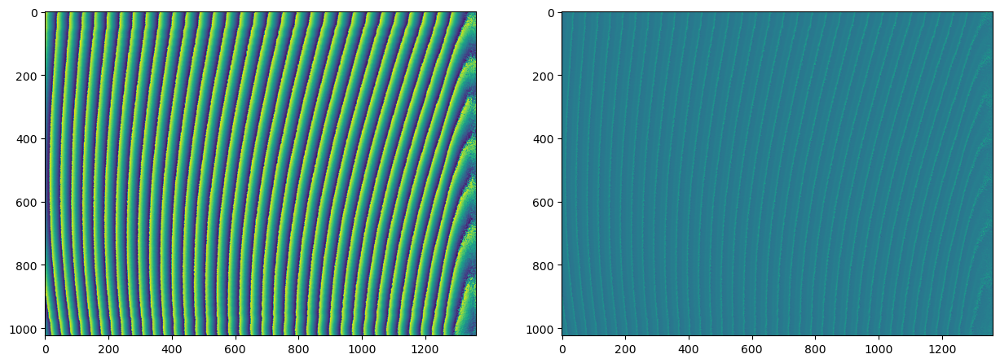

1 6370687.885067772
2 6370685.938855086
3 6370684.747006447
4 6370682.917669479
5 6370681.04345776
6 6370679.594855802
7 6370678.155928295
8 6370676.95120419
9 6370675.980144225
10 6370674.243536938
11 6370673.037010251
12 6370671.841859391
13 6370670.43483275
14 6370668.839186793
15 6370667.135027662
16 6370665.039577762
17 6370663.138957334
18 6370660.876912894
19 6370658.286262554
20 6370654.921295904
21 6370650.800781576
22 6370645.553652686
23 6370638.180775932
24 6370628.672932392
25 6370615.206974781
26 6370597.077999666
27 6370572.621986736
28 6370539.46904567
29 6370494.881992554
30 6370438.143992629
31 6370367.75422819
32 6370285.543516516
33 6370192.403274804
34 6370083.464868315
35 6369960.728605377
36 6369826.739842527
37 6369691.229679836
38 6369566.184662579
39 6369473.141619692
40 6369428.247645044
41 6369400.198431166
42 6369363.421768928
43 6369318.716572169
44 6369253.340426048
45 6369189.364896536
46 6369123.743393253
47 6369101.888202585
48 6369097.172466172
49 636

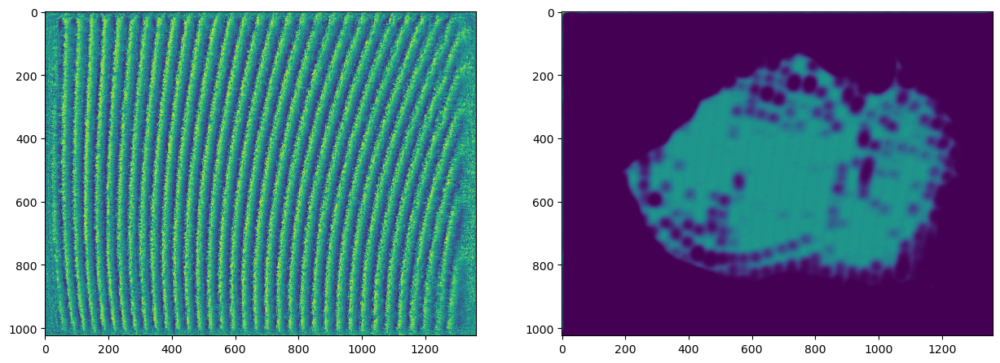

101 6369037.72537402
102 6369037.479088029
103 6369037.108337667
104 6369036.900292676
105 6369036.609844674
106 6369036.307456589
107 6369036.025164364
108 6369035.78642991
109 6369035.448702212
110 6369035.201577729


KeyboardInterrupt: 

In [242]:
epochs = 1001
loss_arr = []

for itr in range(epochs):

    optimizer.zero_grad()

    obj = torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm 
    wave_z = torch.angle(wave_obj.propogate(dist)).float()
    
    wave_proc = model(wave_z.unsqueeze(0).unsqueeze(0)).squeeze()
    
    loss = loss_fn(wave_proc, target)
    loss.backward()
    optimizer.step()
    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    if (itr) % 100 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(wave_z.detach().T)
        axs[1].imshow(wave_proc.detach().T)

        plt.show()

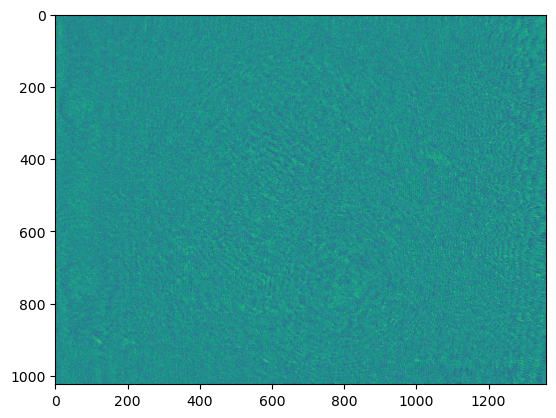

In [ ]:
plt.imshow(obj_phase.detach())

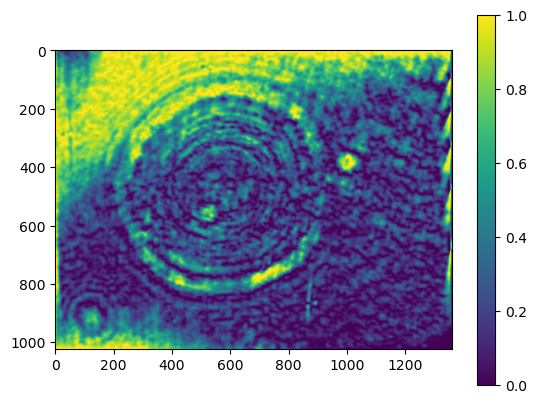

In [237]:
plt.imshow(wave_proc.detach().T)
plt.colorbar()